<a href="https://colab.research.google.com/github/CarlosModinez/brazilian_weeds/blob/main/weed_species_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Dataset organizer

I don't have to run it if your dataset is correct structured

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os
import shutil
import cv2

ORIGINAL_DATASET_PATH = "drive/My Drive/TCC/brazilian_weeds_2020"

def search_images(path, image_paths=[], extensions=['jpg', 'jpeg']):
  image_extensions = extensions

  if os.path.exists(path) and os.path.isdir(path):
    for file in os.listdir(path):
      file_extension = file.split(".")[-1].lower()
      if file_extension in image_extensions:
        image_paths.append(os.path.join(path, file))
      elif os.path.isdir(os.path.join(path, file)):
        search_images(os.path.join(path, file), image_paths)
  return image_paths

def find_class_index(image_path: str):
  classes = [
    "Amaranthus hybridos", "Cyclospermum leptophyllum", "Tridax procumbens",
    "Sonchus oleraceus", "Bidens-pilosa", "Lelidium virginum", "Ipomoeae purpurea",
    "Leonurus sibiricus", "Sorghum arundinaceum", "Rhynchelytrumrepens",
    "Digitaria insularis", "Choris barbata", "Cenchus echinatus", "Physalis angulata"
  ]

  for index, class_name in enumerate(classes):
    if class_name.lower() in image_path.lower():
      return index
  return None

def build_dataset():
  destination_seg_dataset = "drive/My Drive/TCC/brazilian_weeds_2020_species_segmentation/"
  destination_images_path =  os.path.join(destination_seg_dataset, 'images')
  destination_masks_path =  os.path.join(destination_seg_dataset, 'masks')

  if os.path.exists(destination_seg_dataset):
    print("DATASET ALREADY ORGANIZER")
    return
  else:
    os.mkdir(destination_seg_dataset)

  if not os.path.exists(destination_images_path):
    os.mkdir(destination_images_path)

  if not os.path.exists(destination_masks_path):
    os.mkdir(destination_masks_path)

  image_paths = search_images(ORIGINAL_DATASET_PATH, [])

  for index, image_path in enumerate(image_paths):
    print(f"image {index}: {image_path}")

    im_width = 480
    im_height = 480

    index = find_class_index(image_path)
    image = cv2.imread(image_path)
    image = cv2.resize(image, (im_width, im_height))

    mask = cv2.imread(image_path.replace('JPG', 'png'), cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (im_width, im_height))
    mask[mask != 0] = 255 # to remove the effect of resizing

    modified_mask = np.zeros((mask.shape[0], mask.shape[1], 1), dtype=np.uint8)
    modified_mask[:, :, 0] = ((mask/255) * (index + 1)).astype('uint8')

    destination_image = os.path.join(destination_images_path, image_path.split("/")[-1])
    destination_mask = os.path.join(destination_masks_path, image_path.split("/")[-1].replace('JPG', 'png'))

    cv2.imwrite(destination_image, image)
    cv2.imwrite(destination_mask, modified_mask)

build_dataset()

image 0: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-07-2020/DSC00353.JPG
image 1: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-07-2020/DSC00354.JPG
image 2: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-07-2020/DSC00355.JPG
image 3: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-07-2020/DSC00356.JPG
image 4: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-07-2020/DSC00357.JPG
image 5: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-07-2020/DSC00358.JPG
image 6: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-11-2020/DSC00538.JPG
image 7: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-11-2020/DSC00539.JPG
image 8: drive/My Drive/TCC/brazilian_weeds_2020/Amaranthaceae/Amaranthus hybridos/12-11-2020/DSC00540.JPG
image 9: drive/My Drive/TCC/brazilian

## Setup

In [ ]:
!pip install -U segmentation-models-pytorch albumentations --user
!pip uninstall segmentation-models-pytorch
!pip install segmentation-models-pytorch

!pip uninstall pretrainedmodels
!pip uninstall efficientnet-pytorch
!pip uninstall timm

!pip install timm==0.9.12
!pip install pretrainedmodels>=0.7.4
!pip install efficientnet-pytorch>=0.7.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 19.0 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=cd9b66c6440a50121c230cf6843a6170a9f0349b7de28e84ba412618bf580426
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60945 sha256=7659e1c9f1a9f99da75318f7dbd8add407f620f169c816de3d0e620439a53106
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorch pretrainedmodels
Found existing installation: segmentation-models-pytorch 0

## Visualization functions

In [ ]:
def visualize(**images):
  """PLot images in one row."""
  n = len(images)
  plt.figure(figsize=(10, 5))
  for i, (name, image) in enumerate(images.items()):
    plt.subplot(1, n, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.title(' '.join(name.split('_')).title())
    plt.imshow(image)
    plt.show()

def visualize_im_mask(image, mask, colors=None):
  """PLot image and mask with maximum of 16 classes"""
  classes_colors = np.array(colors) if colors != None else np.array([
    # [0, 0, 0],        # background
    [255, 111, 97],   # Amaranthus hybridos
    [255, 215, 0],    # Cyclospermum leptophyllum
    [64, 224, 208],   # Tridax procumbens
    [147, 112, 219],  # Sonchus oleraceus
    [0, 255, 0],      # Bidens-pilosa
    [255, 69, 0],     # Lelidium virginum
    [135, 206, 235],  # Ipomoeae purpurea
    [138, 43, 226],   # Leonurus sibiricus
    [255, 20, 147],   # Sorghum arundinaceum
    [50, 205, 50],    # Rhynchelytrumrepens
    [186, 85, 211],   # Digitaria insularis
    [255, 99, 71],    # Choris barbata
    [0, 206, 209],    # Cenchus echinatus
    [139, 69, 19],    # Physalis angulata
  ])

  final_mask = np.zeros_like(image)
  for i in range(0, mask.shape[-1]):
    object_mask = mask[:,:,i] == 1.0
    final_mask[object_mask] = classes_colors[i]

  fig, axs = plt.subplots(1,2,figsize=(10,5))
  axs[0].imshow(image)
  axs[1].imshow(final_mask)

def visualize_im_mask_pr(image, gt_mask, pd_mask):
  classes_colors = np.array([
    # [0, 0, 0],        # background
    [255, 111, 97],   # Amaranthus hybridos
    [255, 215, 0],    # Cyclospermum leptophyllum
    [64, 224, 208],   # Tridax procumbens
    [147, 112, 219],  # Sonchus oleraceus
    [0, 255, 0],      # Bidens-pilosa
    [255, 69, 0],     # Lelidium virginum
    [135, 206, 235],  # Ipomoeae purpurea
    [138, 43, 226],   # Leonurus sibiricus
    [255, 20, 147],   # Sorghum arundinaceum
    [50, 205, 50],    # Rhynchelytrumrepens
    [186, 85, 211],   # Digitaria insularis
    [255, 99, 71],    # Choris barbata
    [0, 206, 209],    # Cenchus echinatus
    [139, 69, 19],    # Physalis angulata
  ])

  final_gt_mask = np.zeros_like(image)
  final_pd_mask = np.zeros_like(image)

  for i in range(0, gt_mask.shape[-1]):
    object_mask = gt_mask[:,:,i] == 1.0
    final_gt_mask[object_mask] = classes_colors[i]

  for i in range(0, pd_mask.shape[-1]):
    object_mask = pd_mask[:,:,i] == 1.0
    final_pd_mask[object_mask] = classes_colors[i]

  fig, axs = plt.subplots(1,3,figsize=(15,5))
  axs[0].imshow(image)
  axs[1].imshow(final_gt_mask)
  axs[2].imshow(final_pd_mask)


## Loading data

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch

import segmentation_models_pytorch as smp
import segmentation_models_pytorch.utils
import albumentations as albu

from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

DATASET_PATH = 'drive/My Drive/TCC/brazilian_weeds_2020_species_segmentation'
x_dir = os.path.join(DATASET_PATH, 'images')
y_dir = os.path.join(DATASET_PATH, 'masks')

x_filenames = os.listdir(x_dir)
y_filenames = os.listdir(y_dir)

x_train, x_temp, y_train, y_temp = train_test_split(x_filenames, y_filenames, test_size=0.3, random_state=42)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42)

# Print the number of samples in each set
print(f"Total: {len(x_filenames)} samples")
print(f"Train set: {len(x_train)} samples")
print(f"Validation set: {len(x_val)} samples")
print(f"Test set: {len(x_test)} samples")

Total: 547 samples
Train set: 382 samples
Validation set: 82 samples
Test set: 83 samples


In [ ]:
class Dataset(Dataset):
  CLASSES = [
    "background", "Amaranthus hybridos", "Cyclospermum leptophyllum", "Tridax procumbens",
    "Sonchus oleraceus", "Bidens-pilosa", "Lelidium virginum", "Ipomoeae purpurea",
    "Leonurus sibiricus", "Sorghum arundinaceum", "Rhynchelytrumrepens",
    "Digitaria insularis", "Choris barbata", "Cenchus echinatus", "Physalis angulata"
  ]

  def __init__(self, x_path, y_path, images, masks, classes=None, preprocessing=None, augmentation=None):
    self.ids = images
    self.images_fps = [os.path.join(x_path, image_id) for image_id in images]
    self.masks_fps = [os.path.join(y_path, mask_id) for mask_id in masks]
    self.class_values = [self.CLASSES.index(cls) for cls in classes]
    self.preprocessing = preprocessing
    self.augmentation = augmentation

  def __getitem__(self, index):
    # read data

    # print(f"image fps: {self.images_fps[index]}")
    image = cv2.imread(self.images_fps[index])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(self.masks_fps[index], 0)

    # print(f'Before transoform: {mask.shape}')

    # get class from mask
    masks = [(mask == v) for v in self.class_values]
    mask = np.stack(masks, axis=-1).astype('float')

    # print(f'After transoform: {mask.shape}')

    # apply augmentations
    if self.augmentation:
      sample = self.augmentation(image=image, mask=mask)
      image, mask = sample['image'], sample['mask']

    # apply preprocessing
    if self.preprocessing:
      sample = self.preprocessing(image=image, mask=mask)
      image, mask = sample['image'], sample['mask']

    return image, mask

  def __len__(self):
    return len(self.ids)

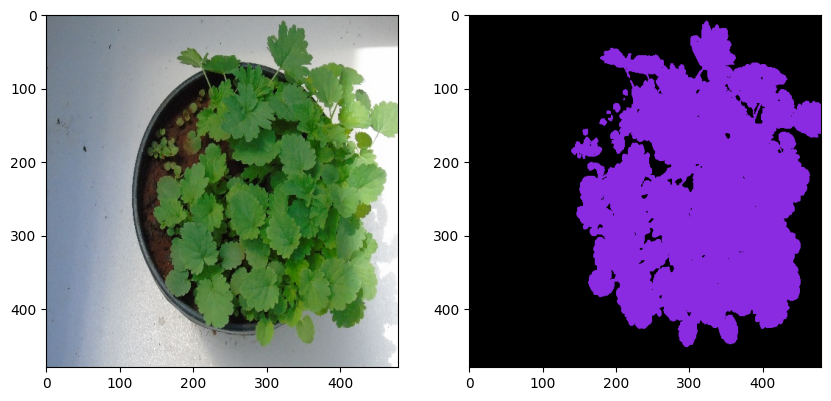

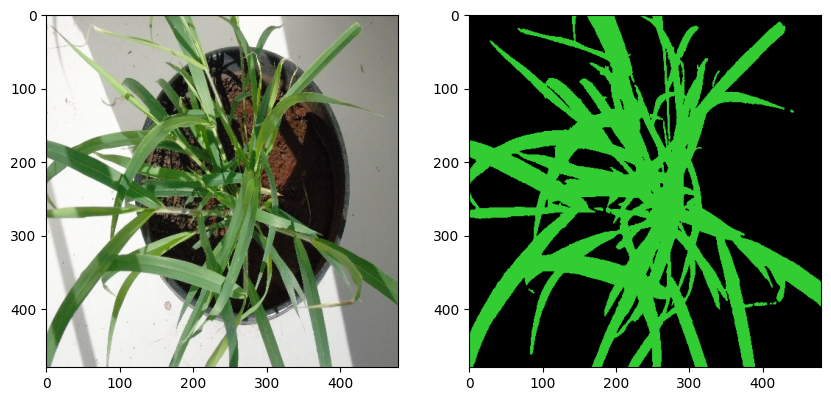

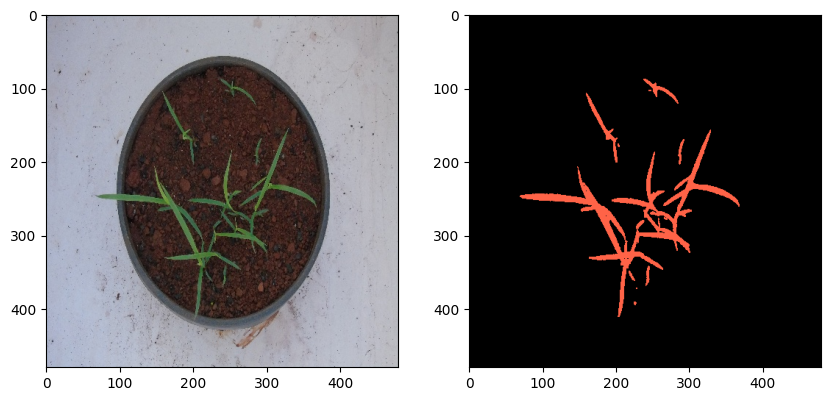

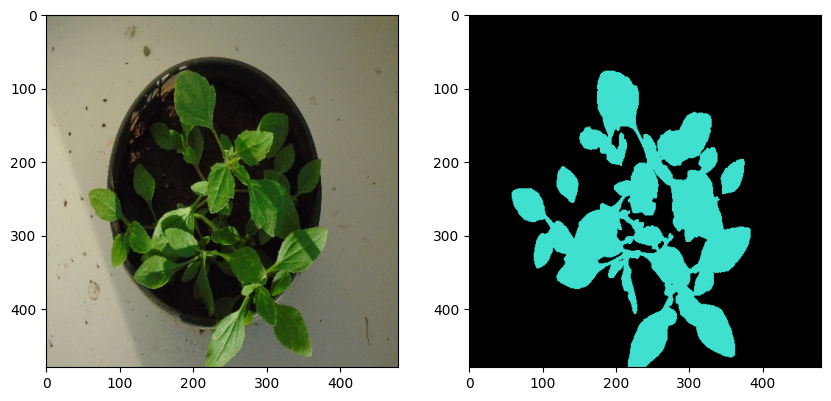

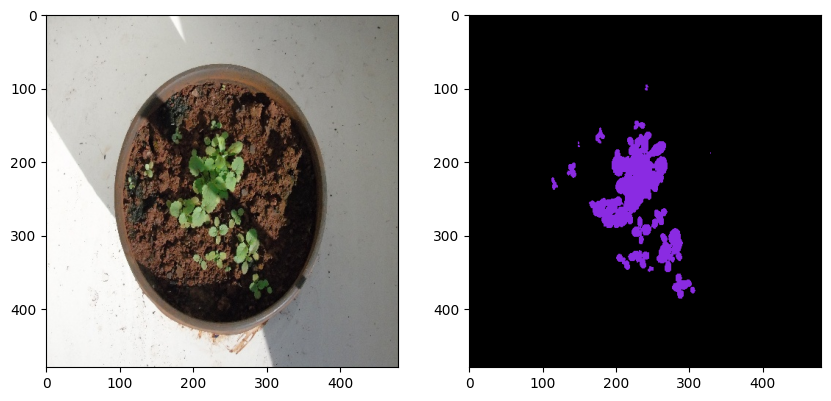

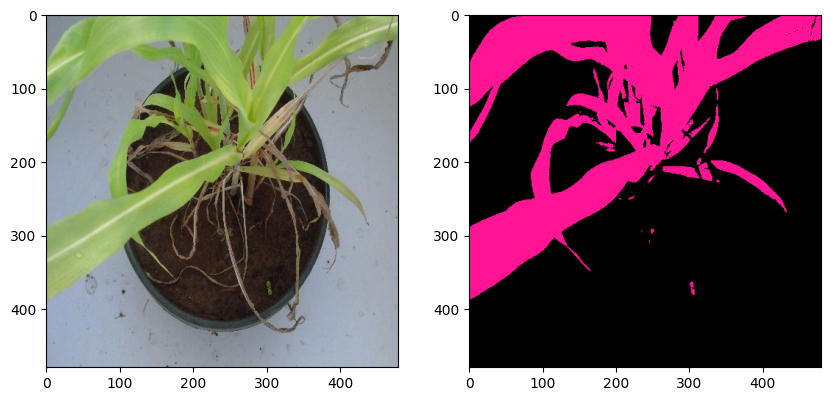

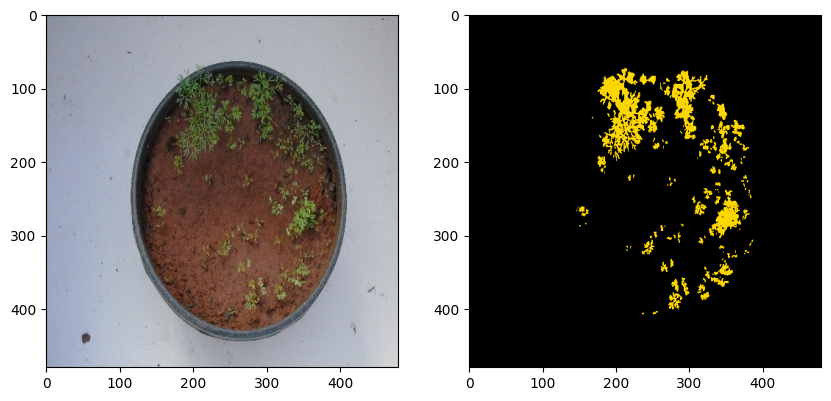

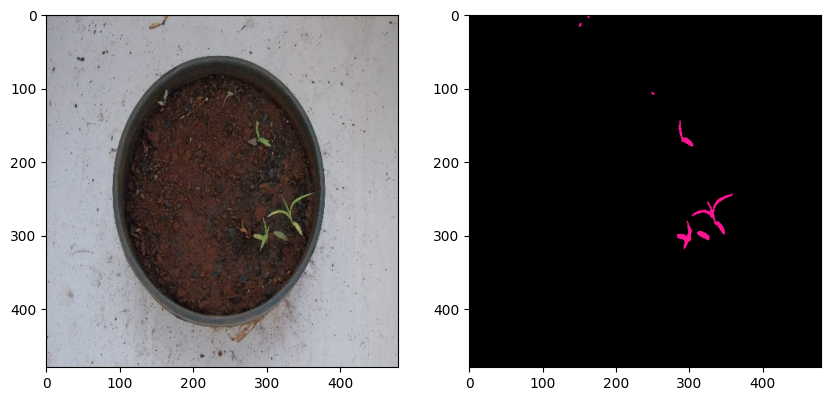

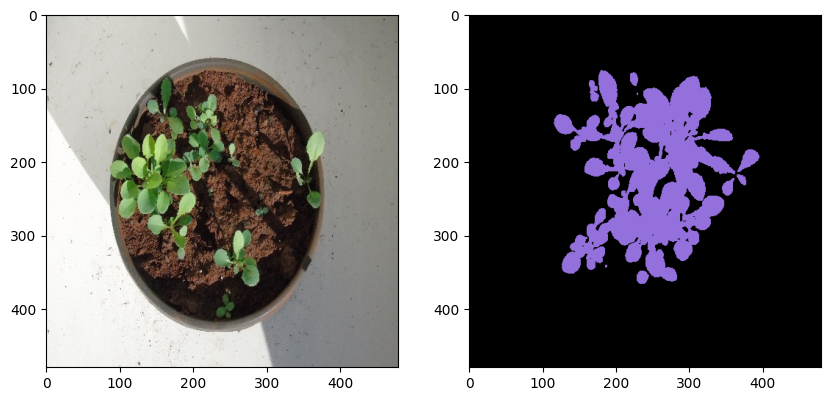

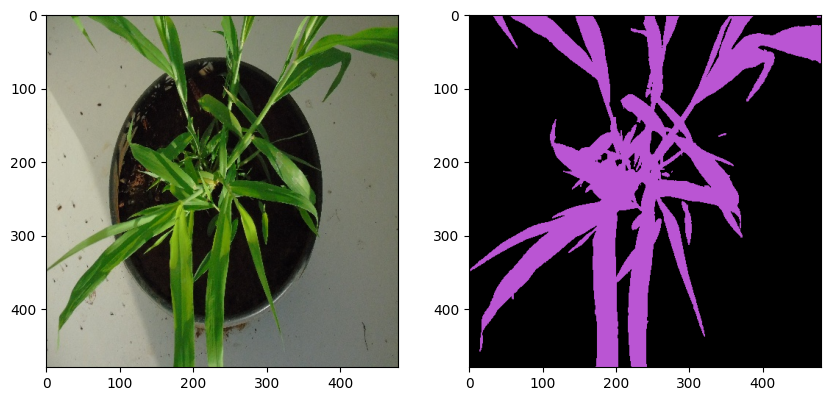

In [ ]:
seg_dataset = "drive/My Drive/TCC/brazilian_weeds_2020_species_segmentation"
images_path =  os.path.join(seg_dataset, 'images')
masks_path =  os.path.join(seg_dataset, 'masks')
all_classes = [
    "Amaranthus hybridos", "Cyclospermum leptophyllum", "Tridax procumbens",
    "Sonchus oleraceus", "Bidens-pilosa", "Lelidium virginum", "Ipomoeae purpurea",
    "Leonurus sibiricus", "Sorghum arundinaceum", "Rhynchelytrumrepens",
    "Digitaria insularis", "Choris barbata", "Cenchus echinatus", "Physalis angulata"
  ]

dataset = Dataset(images_path, masks_path, x_train, y_train, classes=all_classes)

for i in range(10):
  image, mask = dataset[i]
  visualize_im_mask(image, mask)

## Augmentations
- horizontal flip
- affine transforms
- perspective transforms
- brightness/contrast/colors manipulations
- image bluring and sharpening
- gaussian noise
- random crops


In [ ]:
import albumentations as albu

def get_training_augmentation():
    train_transform = [
        albu.HorizontalFlip(p=0.5),
        albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),
        albu.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
        albu.RandomCrop(height=320, width=320, always_apply=True),
        albu.IAAAdditiveGaussianNoise(p=0.2),
        albu.IAAPerspective(p=0.5),
        albu.OneOf([
          albu.CLAHE(p=1),
          albu.RandomBrightness(p=1),
          albu.RandomGamma(p=1),
        ], p=0.9),

        albu.OneOf([
          albu.IAASharpen(p=1),
          albu.Blur(blur_limit=3, p=1),
          albu.MotionBlur(blur_limit=3, p=1),
        ], p=0.9),

        albu.OneOf([
          albu.RandomContrast(p=1),
          albu.HueSaturationValue(p=1),
        ], p=0.9),
    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        albu.PadIfNeeded(480, 480)
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform

    Args:
        preprocessing_fn (callbale): data normalization function
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose

    """

    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:261: FutureWarning: IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead
  warnings.warn("IAAAdditiveGaussianNoise is deprecated. Please use GaussNoise instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:384: FutureWarning: This IAAPerspective is deprecated. Please use Perspective instead
  warnings.warn("This IAAPerspective is deprecated. Please use Perspective instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1258: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/albumentations/imgaug/transforms.py:231: FutureWarning: IAASharpen is deprecated. Please use Sharpen instead
  warnings.warn("IAASharpen is deprecated. Please use Sharpen instead", FutureWarning)
/usr/local/lib/python3.10/dist-packages/alb

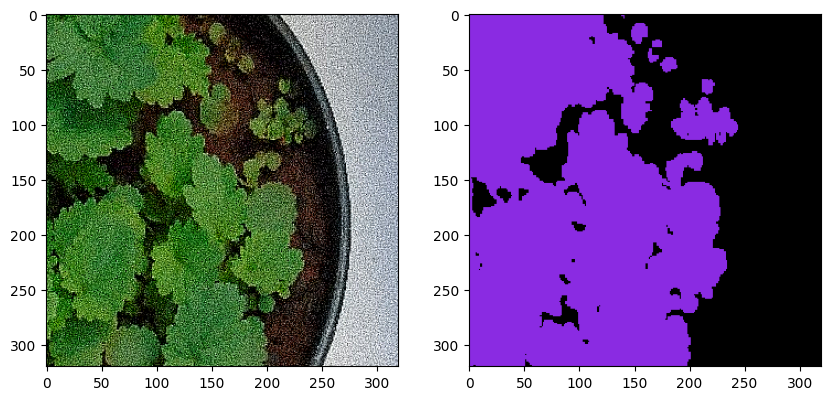

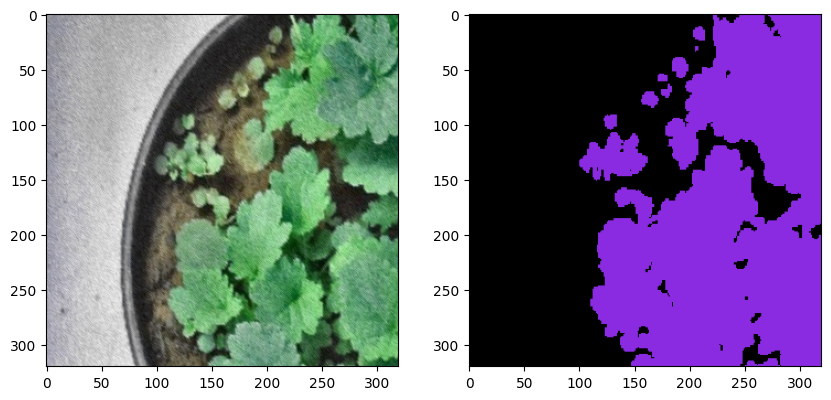

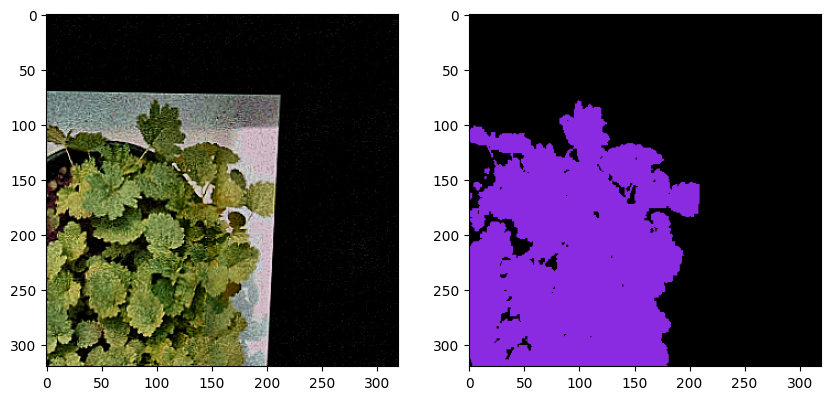

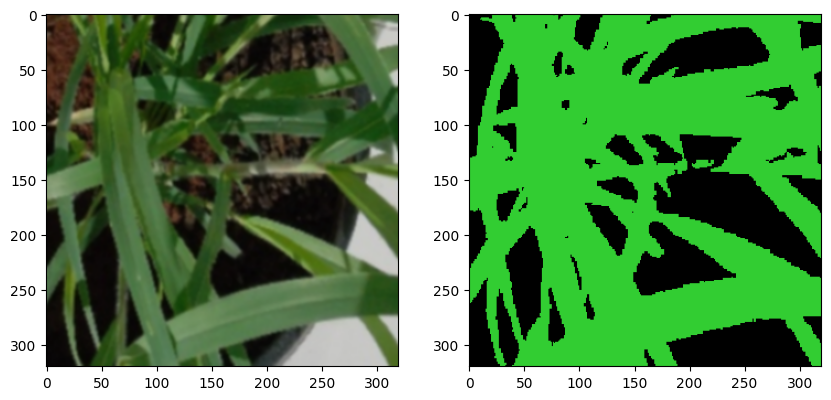

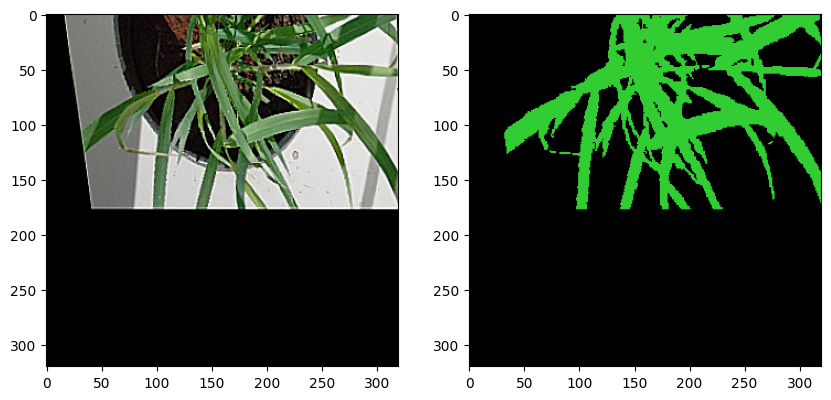

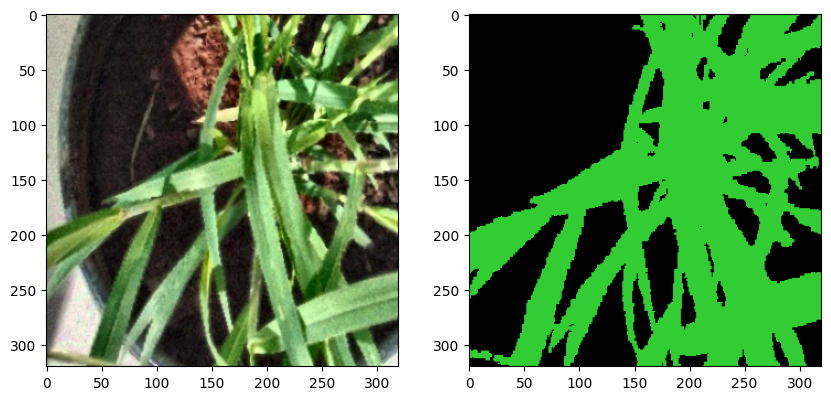

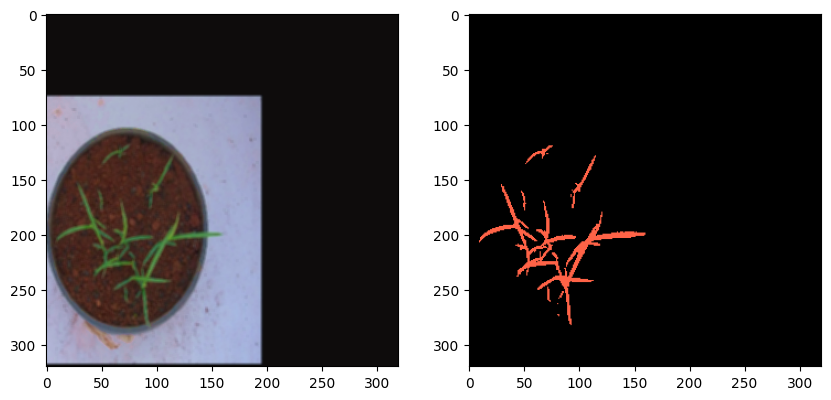

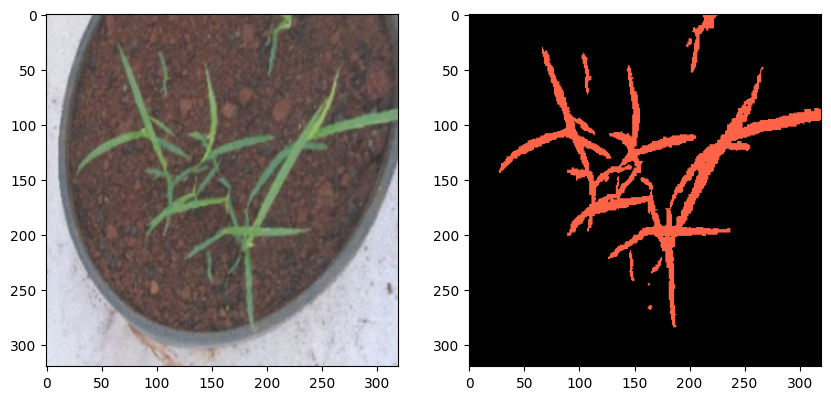

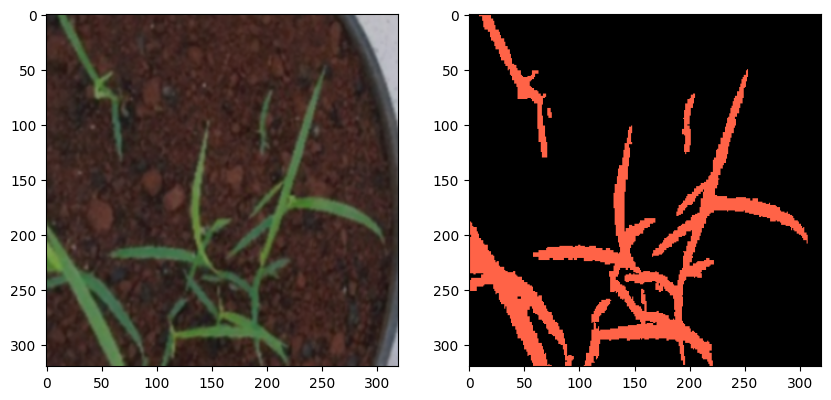

In [ ]:
augmented_dataset = Dataset(
    images_path, masks_path,
    x_train, y_train,
    augmentation=get_training_augmentation(),
    classes=all_classes
)

# same image with different random transforms
for j in range(3):
  for i in range(3):
    image, mask = augmented_dataset[j]
    visualize_im_mask(image, mask)

## Model base

In [ ]:
ENCODER = 'resnet152'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation
DEVICE = 'cuda'

# create segmentation model with pretrained encoder
preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)
train_dataset = Dataset(
    images_path, masks_path,
    x_train, y_train,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=all_classes,
)

valid_dataset = Dataset(
    images_path, masks_path,
    x_val, y_val,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=all_classes,
)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=12)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


## Models creation

- DeepLabV3
- DeepLabV3+
- Unet
- Unet++
- FPN
- PAN
- PSPNET

In [ ]:
CLASSES = all_classes
model_deeplabv3 = smp.DeepLabV3(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHTS, classes=len(CLASSES), activation=ACTIVATION)
model_DeepLabV3Plus = smp.DeepLabV3Plus(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHTS, classes=len(CLASSES), activation=ACTIVATION,)
model_Unet = smp.Unet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHTS, classes=len(CLASSES), activation=ACTIVATION)
model_UnetPlusPlus = smp.UnetPlusPlus(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHTS, classes=len(CLASSES), activation=ACTIVATION)
model_fpn = smp.FPN(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHTS, classes=len(CLASSES), activation=ACTIVATION)
# model_PAN = smp.PAN(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHTS, classes=len(CLASSES), activation=ACTIVATION)
# model_PSPNet = smp.PSPNet(encoder_name=ENCODER, encoder_weights=ENCODER_WEIGHTS, classes=len(CLASSES), activation=ACTIVATION)

Downloading: "https://download.pytorch.org/models/resnet152-b121ed2d.pth" to /root/.cache/torch/hub/checkpoints/resnet152-b121ed2d.pth
100%|██████████| 230M/230M [00:01<00:00, 236MB/s]


In [ ]:
def train_model(model, identifier, train_loader, valid_loader):
  learning_rate = 1e-4
  loss = smp.utils.losses.DiceLoss()
  metrics = [smp.utils.metrics.IoU(threshold=0.5)]
  optimizer = torch.optim.Adam([dict(params=model.parameters(), lr=learning_rate)])

  train_epoch = smp.utils.train.TrainEpoch(model, loss=loss, metrics=metrics, optimizer=optimizer, device=DEVICE, verbose=True)
  valid_epoch = smp.utils.train.ValidEpoch(model, loss=loss, metrics=metrics, device=DEVICE, verbose=True)

  max_score = 0
  EPOCHS = 10

  for i in range(0, EPOCHS):
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)

    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
      max_score = valid_logs['iou_score']
      torch.save(model, f'drive/My Drive/TCC/best_{identifier}_model.pth')
      print('Model saved!')

    if i % 25 == 0 and i != 0:
      learning_rate = learning_rate / 10
      optimizer.param_groups[0]['lr'] = learning_rate
      print(f'Decrease decoder learning rate to {learning_rate}!')

  return train_logs, valid_logs

# deeplabv3plus_train_logs, deeplabv3plus_val_logs = train_model(model_DeepLabV3Plus, 'DeepLabV3Plus', train_loader, valid_loader)
# deeplabv3_train_logs, deeplabv3_val_logs = train_model(model_deeplabv3, 'DeepLabV3', train_loader, valid_loader)
# unet_train_logs, unet_val_logs = train_model(model_Unet, 'Unet', train_loader, valid_loader)
unetplus_train_logs, unetplus_val_logs = train_model(model_UnetPlusPlus, 'UnetPlusPlus', train_loader, valid_loader)
# fpn_train_logs, fpn_val_logs = train_model(model_fpn, 'fpn', train_loader, valid_loader)


Epoch: 0
train:   0%|          | 0/48 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


valid:   0%|          | 0/82 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


valid: 100%|██████████| 82/82 [00:12<00:00,  6.80it/s, dice_loss - 0.9521, iou_score - 0.03208]
Model saved!

Epoch: 1
valid: 100%|██████████| 82/82 [00:12<00:00,  6.34it/s, dice_loss - 0.9473, iou_score - 0.04509]
Model saved!

Epoch: 2
valid: 100%|██████████| 82/82 [00:10<00:00,  7.91it/s, dice_loss - 0.9437, iou_score - 0.05507]
Model saved!

Epoch: 3
valid: 100%|██████████| 82/82 [00:10<00:00,  7.52it/s, dice_loss - 0.9444, iou_score - 0.05671]
Model saved!

Epoch: 4
valid: 100%|██████████| 82/82 [00:12<00:00,  6.55it/s, dice_loss - 0.9344, iou_score - 0.07072]
Model saved!

Epoch: 5
valid: 100%|██████████| 82/82 [00:11<00:00,  6.97it/s, dice_loss - 0.9311, iou_score - 0.07054]

Epoch: 6
valid: 100%|██████████| 82/82 [00:12<00:00,  6.57it/s, dice_loss - 0.9244, iou_score - 0.09715]
Model saved!

Epoch: 7
valid: 100%|██████████| 82/82 [00:12<00:00,  6.60it/s, dice_loss - 0.9274, iou_score - 0.08278]

Epoch: 8
valid: 100%|██████████| 82/82 [00:11<00:00,  6.92it/s, dice_loss - 0.9159,

## Testing

In [ ]:
import segmentation_models_pytorch.utils
import torch

MODEL_PATH = './drive/My Drive/TCC'
best_models = [
  # torch.load(MODEL_PATH + '/best_DeepLabV3Plus_model.pth'),
  # torch.load(MODEL_PATH + '/best_DeepLabV3_model.pth'),
  # torch.load(MODEL_PATH + '/best_Unet_model.pth'),
  torch.load(MODEL_PATH + '/best_UnetPlusPlus_model.pth'),
  # torch.load(MODEL_PATH + '/best_fpn_model.pth')
]

loss = smp.utils.losses.DiceLoss()
metrics = [
  smp.utils.metrics.IoU(threshold=0.5),
  smp.utils.metrics.Fscore(threshold=0.5),
  smp.utils.metrics.Accuracy(threshold=0.5),
  smp.utils.metrics.Recall(threshold=0.5),
  smp.utils.metrics.Precision(threshold=0.5)
]

all_logs = []

for model in best_models:
  best_model = model
  best_model.eval()
  best_model.to(DEVICE)

  # create test dataset
  test_dataset = Dataset(
      images_path, masks_path,
      x_test, y_test,
      augmentation=get_validation_augmentation(),
      preprocessing=get_preprocessing(preprocessing_fn),
      classes=all_classes,
  )

  test_dataloader = DataLoader(test_dataset)

  # evaluate model on test set
  test_epoch = smp.utils.train.ValidEpoch(
      model=best_model,
      loss=loss,
      metrics=metrics,
      device=DEVICE,
  )

  logs = test_epoch.run(test_dataloader)
  all_logs.append(logs)


valid: 100%|██████████| 83/83 [00:46<00:00,  1.77it/s, dice_loss - 0.9049, iou_score - 0.1189, fscore - 0.2081, accuracy - 0.8976, recall - 0.84, precision - 0.1213]


## Visualize results

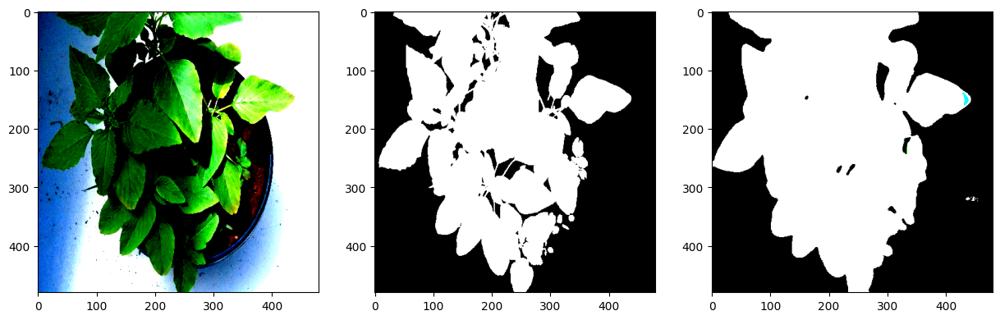

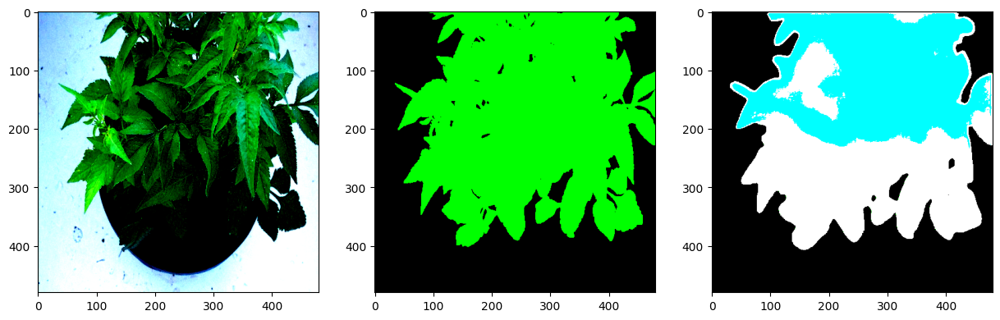

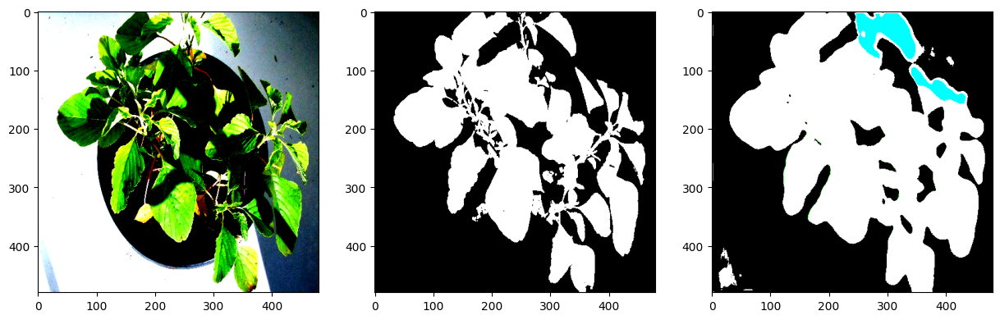

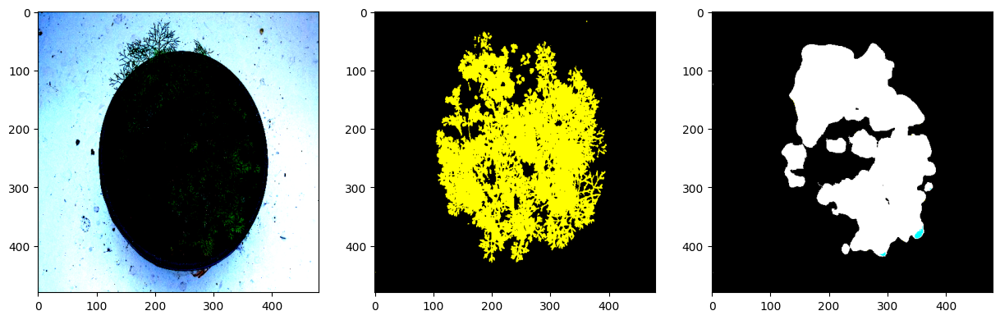

In [ ]:
test_dataset_vis = Dataset(
    images_path, masks_path,
    x_test, y_test,
    classes=all_classes,
)

for i in range(4):
  n = np.random.choice(len(test_dataset))
  image_vis = test_dataset_vis[n][0].astype('uint8')
  image, gt_mask = test_dataset[n]

  gt_mask = gt_mask.squeeze()

  x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)


  pr_mask = best_model.predict(x_tensor)

  # aplicar softmax e argmax na camada das classes
  # deve ser feito durante o treinamento também

  pr_mask = (pr_mask.squeeze().cpu().numpy().round())

  # visualize_im_mask(np.transpose(image, (1,2,0)), np.transpose(gt_mask.astype(np.uint8), (1,2,0)))

  visualize_im_mask_pr(np.transpose(image, (1,2,0)), np.transpose(gt_mask.astype('float'), (1,2,0)), np.transpose(pr_mask.astype('float'), (1,2,0)))

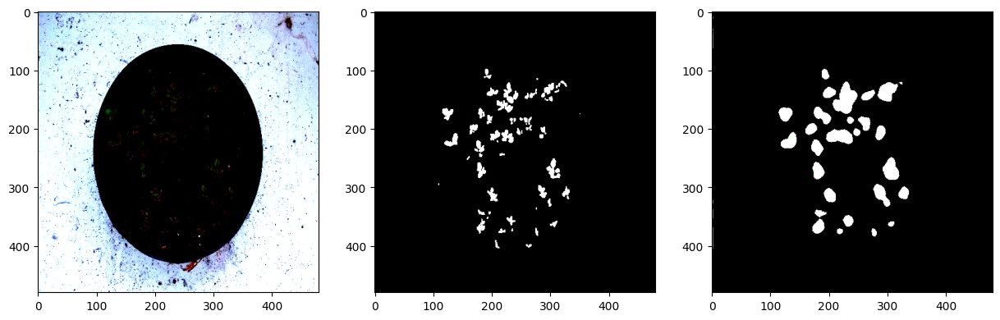

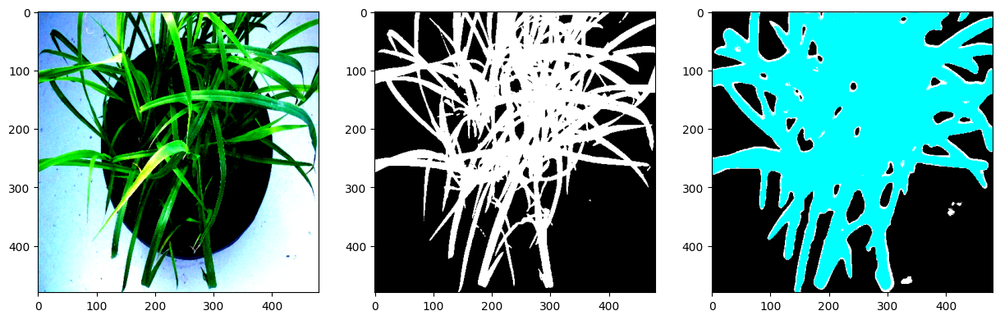

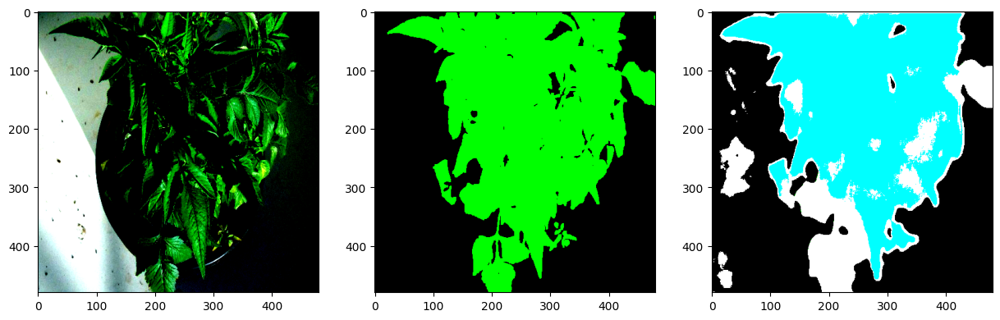

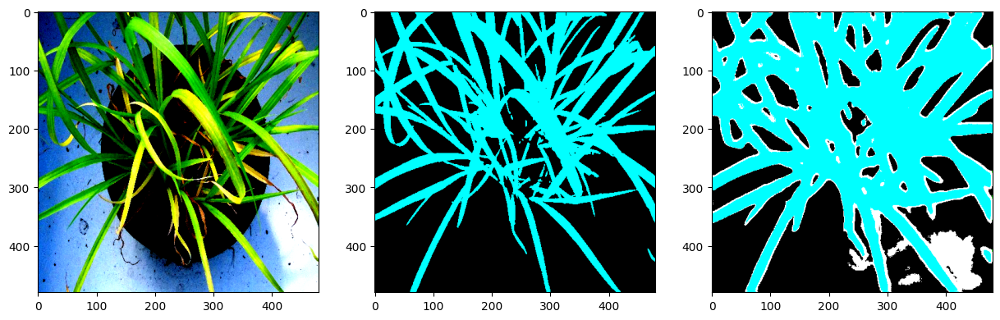

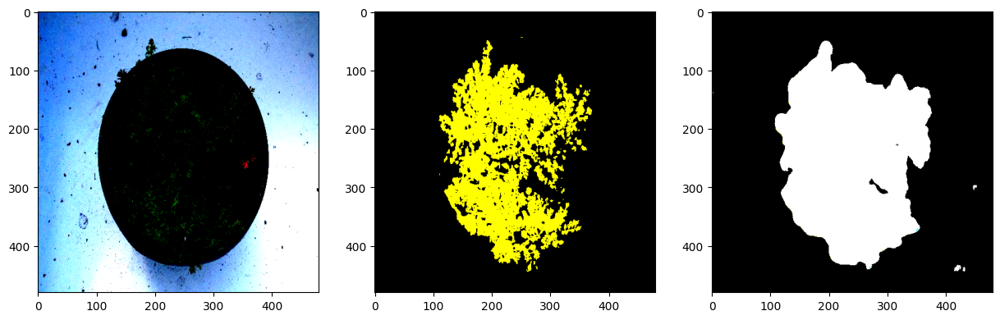

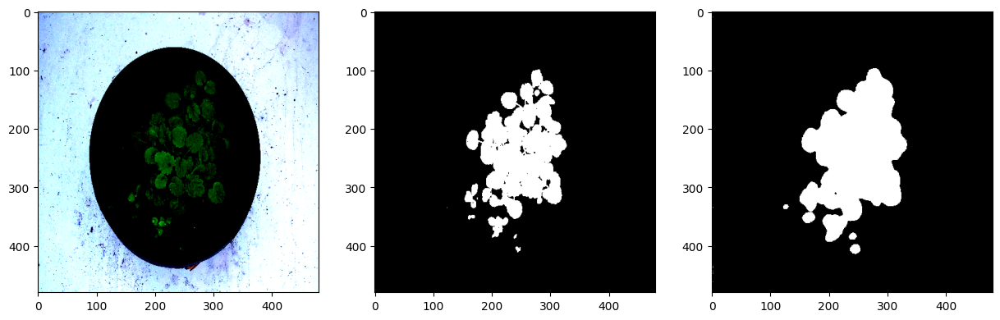

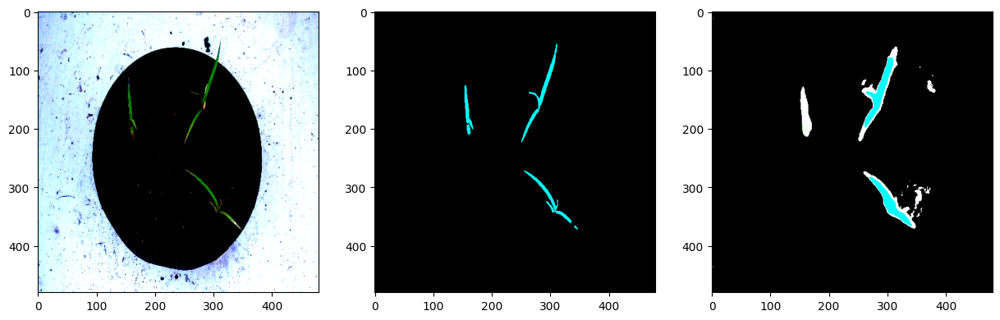

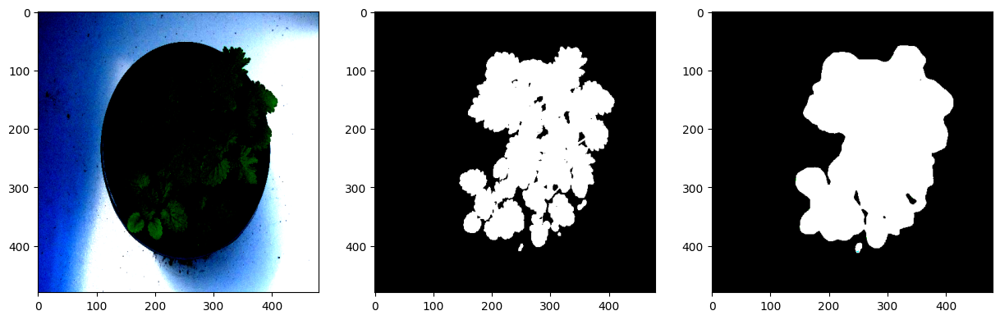

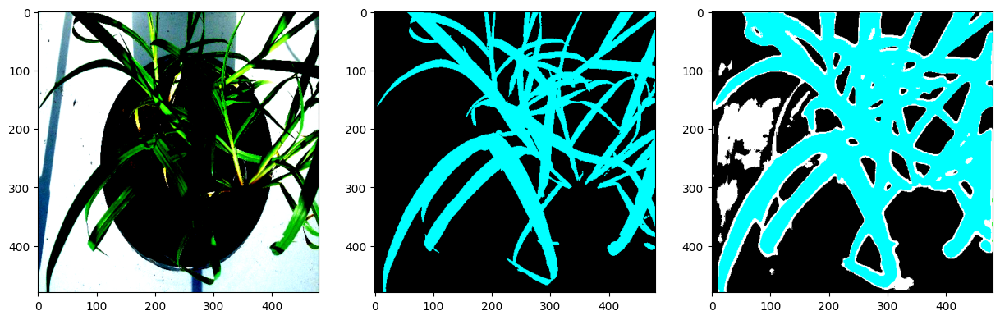

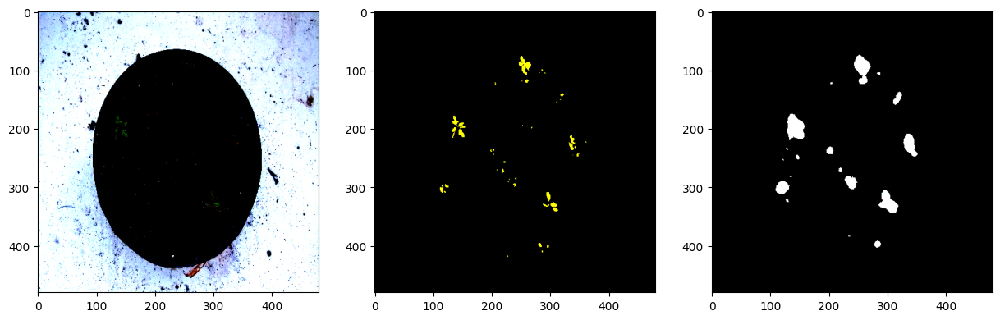

In [ ]:
for i in range(10):
  n = np.random.choice(len(test_dataset))
  image_vis = test_dataset_vis[n][0].astype('uint8')
  image, gt_mask = test_dataset[n]

  gt_mask = gt_mask.squeeze()

  x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
  pr_mask = best_model.predict(x_tensor)
  pr_mask = (pr_mask.squeeze().cpu().numpy().round())

  # plt.imshow(pr_mask)

  visualize_im_mask_pr(np.transpose(image, (1,2,0)), np.transpose(gt_mask.astype(np.uint8), (1,2,0)), np.transpose(pr_mask.astype(np.uint8), (1,2,0)))

<ipython-input-33-13dd04de5717>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, axs_gt = plt.subplots(1, 15, figsize=(30, 4))


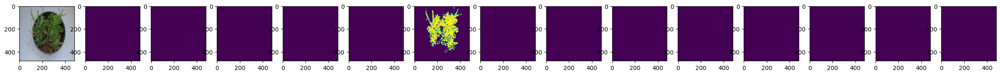

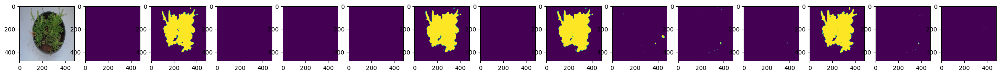

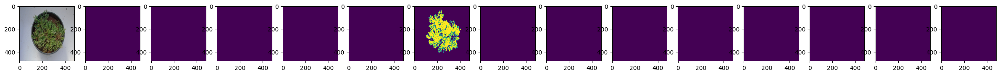

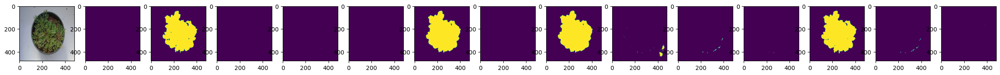

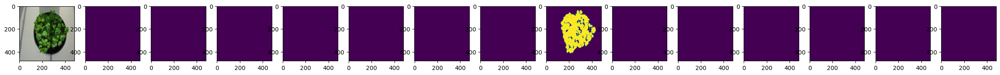

...

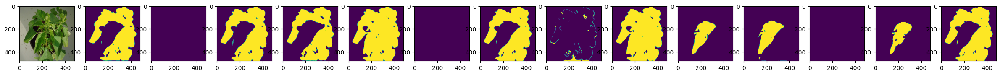

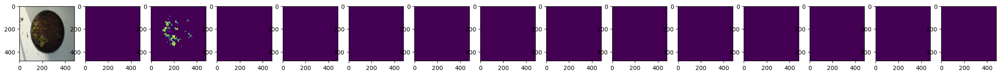

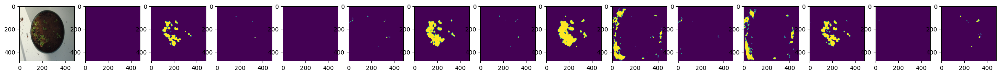

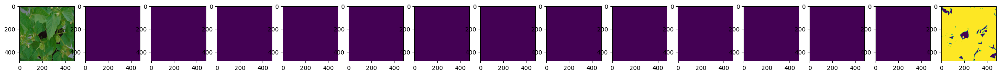

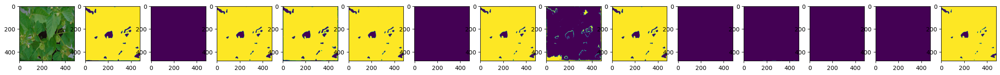

In [ ]:
for i in range(10):
  n = i
  image_vis = test_dataset_vis[n][0].astype('uint8')
  image, gt_mask = test_dataset[n]

  gt_mask = gt_mask.squeeze()

  x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
  pr_mask = best_model.predict(x_tensor)
  pr_mask = (pr_mask.squeeze().cpu().numpy().round())

  _, axs_gt = plt.subplots(1, 15, figsize=(30, 4))
  axs_gt[0].imshow(image_vis)
  for i in range(14):
    axs_gt[i+1].imshow(gt_mask[i,:,:])

  _, axs_pr = plt.subplots(1, 15, figsize=(30, 4))
  axs_pr[0].imshow(image_vis)
  for i in range(14):
    axs_pr[i+1].imshow(pr_mask[i,:,:])

  # visualize_im_mask_pr(np.transpose(image, (1,2,0)), np.transpose(gt_mask.astype(np.uint8), (1,2,0)), np.transpose(pr_mask.astype(np.uint8), (1,2,0)))

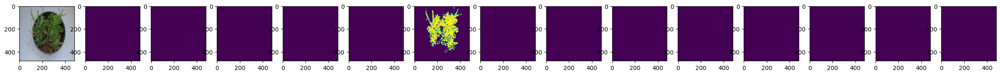

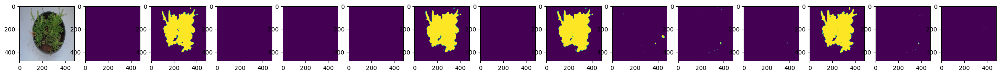

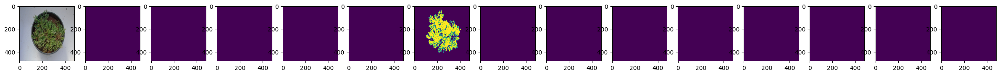

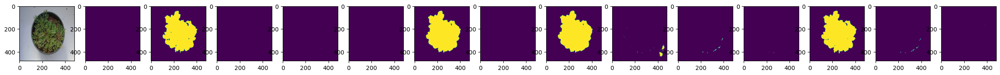

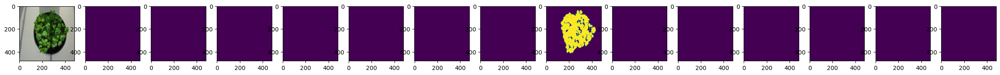

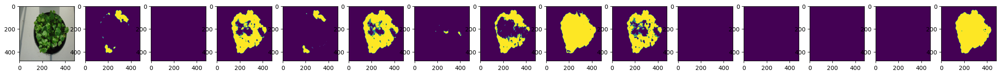

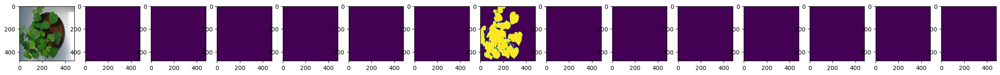

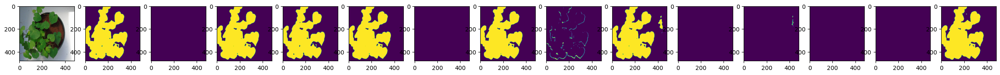

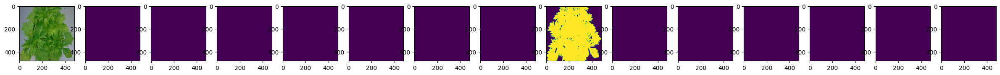

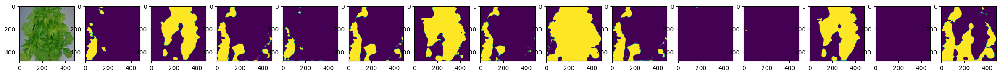

In [ ]:
for i in range(5):
  n = i
  image_vis = test_dataset_vis[n][0].astype('uint8')
  image, gt_mask = test_dataset[n]

  gt_mask = gt_mask.squeeze()

  x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
  pr_mask = best_model.predict(x_tensor)
  pr_mask = (pr_mask[0,:,:,:] > 0.5).cpu().numpy().round()

  _, axs_gt = plt.subplots(1, 15, figsize=(30, 4))
  axs_gt[0].imshow(image_vis)
  for i in range(14):
    axs_gt[i+1].imshow(gt_mask[i,:,:])

  _, axs_pr = plt.subplots(1, 15, figsize=(30, 4))
  axs_pr[0].imshow(image_vis)
  for i in range(14):
    axs_pr[i+1].imshow(pr_mask[i,:,:])

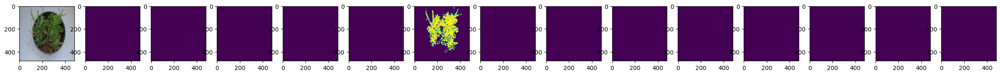

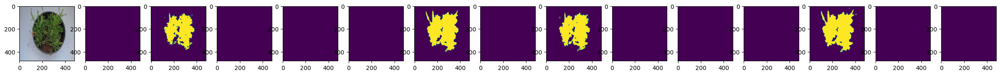

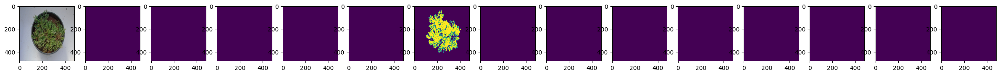

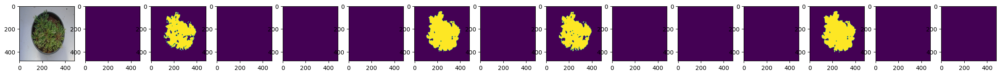

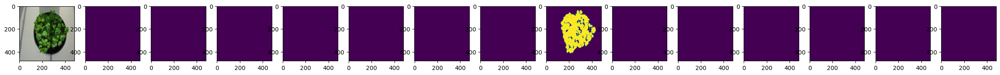

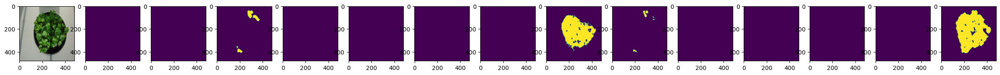

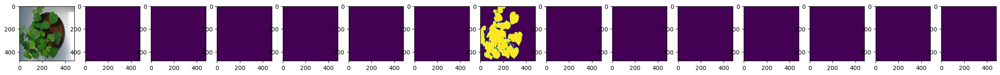

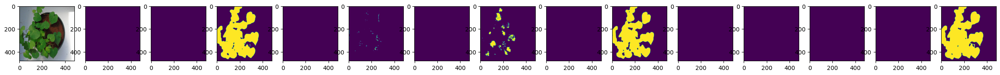

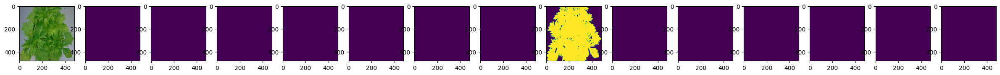

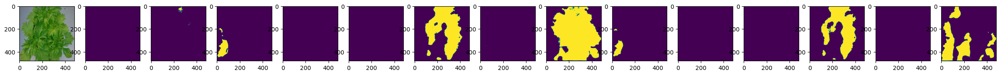

In [ ]:
for i in range(5):
  n = i
  image_vis = test_dataset_vis[n][0].astype('uint8')
  image, gt_mask = test_dataset[n]

  gt_mask = gt_mask.squeeze()

  x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
  pr_mask = best_model.predict(x_tensor)
  pr_mask = (pr_mask[0,:,:,:] > 0.9).cpu().numpy().round()

  _, axs_gt = plt.subplots(1, 15, figsize=(30, 4))
  axs_gt[0].imshow(image_vis)
  for i in range(14):
    axs_gt[i+1].imshow(gt_mask[i,:,:])

  _, axs_pr = plt.subplots(1, 15, figsize=(30, 4))
  axs_pr[0].imshow(image_vis)
  for i in range(14):
    axs_pr[i+1].imshow(pr_mask[i,:,:])

(480, 480, 3)
(480, 480, 14)
<class 'numpy.ndarray'>
<class 'numpy.float64'>
(480, 480, 3)
(480, 480, 14)
<class 'numpy.ndarray'>
<class 'numpy.float64'>


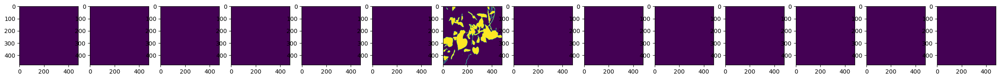

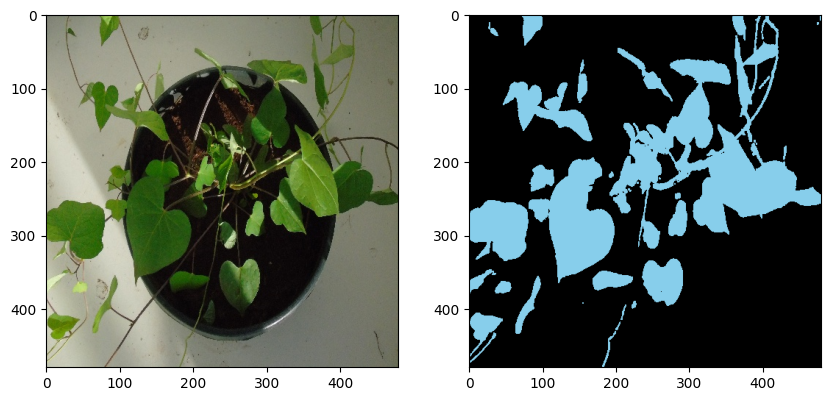

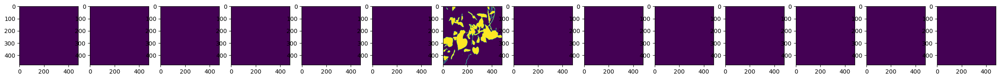

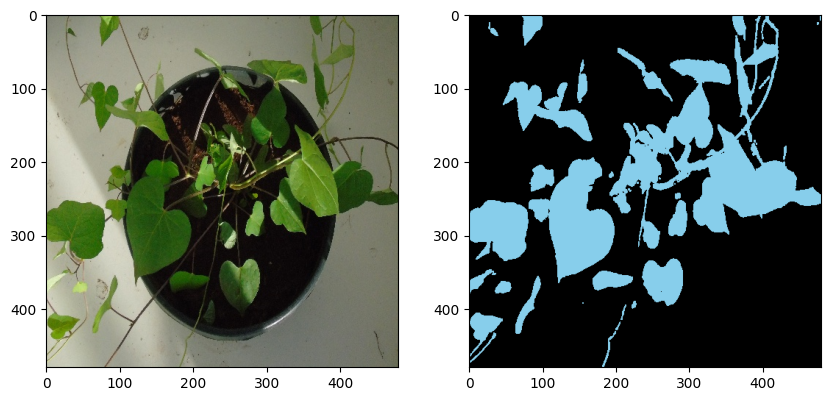

In [ ]:
dataset = Dataset(
    images_path,
    masks_path,
    x_test, y_test,
    classes=all_classes,
    # augmentation=get_validation_augmentation(),
    # preprocessing=get_preprocessing(preprocessing_fn)
)

image, mask = dataset[5]
_, axs = plt.subplots(1, 14, figsize=(30, 4))
for i in range(14):
  axs[i].imshow(mask[:, :, i])

visualize_im_mask(image, mask)

print(image.shape)
print(mask.shape)
print(type(mask))
print(type(mask[0,0,0]))

dataset = Dataset(
    images_path,
    masks_path,
    x_test, y_test,
    classes=all_classes,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn)
)

image, mask = dataset[5]
# image = np.transpose(image, (1,2,0))
# mask = np.transpose(mask, (1,2,0)).astype('float')

print(image.shape)
print(mask.shape)
print(type(mask))
print(type(mask[0,0,0]))

_, axs = plt.subplots(1, 14, figsize=(30, 4))
for i in range(14):
  axs[i].imshow(mask[:, :, i])

visualize_im_mask(image, mask)

(480, 480, 15)


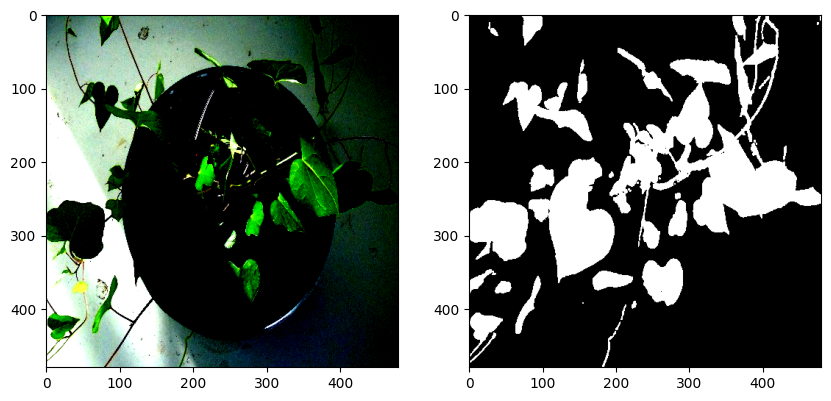

In [ ]:
  print(np.transpose(gt_mask.astype(np.uint8), (1,2,0)).shape)
  visualize_im_mask(np.transpose(image, (1,2,0)), np.transpose(gt_mask.astype(np.uint8), (1,2,0)))